## Project Setup

In [441]:
# all import statements needed for the project, for example:

import math
import re
import bs4
import matplotlib.pyplot as plt
import matplotlib.ticker as tck
import pandas as pd
import requests, zipfile, io
import sqlalchemy as db
import urllib
import urllib.request
import numpy as np

from pathlib import Path
from glob import glob
from datetime import datetime

import geopandas as gpd
import gmaps 
import gmaps.datasets 

import folium
from folium import plugins

import seaborn as sns

In [464]:
# any constants you might need, for example:

TAXI_URL = "https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page"
# add other constants to refer to any local data, e.g. uber & weather
UBER = pd.read_csv("uber_rides_sample.csv")
NEW_YORK_BOX_COORDS = ((40.560445, -74.242330), (40.908524, -73.717047))

DATABASE_URL = "sqlite:///project.db"
DATABASE_SCHEMA_FILE = "schema.sql"
QUERY_DIRECTORY = "queries"

## Part 1: Data Preprocessing

### Calculating distance
Since the dataset only contains the lontitude and the latitude, we define two function to calculate the distance between pickup point and dropoff point. The unit of distance is kilometer.

In [458]:
def calculate_trip_distance(from_coord :tuple, to_coord :tuple) -> int:

    # approximate radius of earth in km
    Radius = 6373.0
    lat1, lon1 = from_coord
    lat2, lon2 = to_coord
    
    dlat = math.radians(lat2 - lat1)
    dlon = math.radians(lon2 - lon1)

    x = (math.sin(dlat / 2) * math.sin(dlat / 2) +
         math.cos(math.radians(lat1)) * math.cos(math.radians(lat2)) *
         math.sin(dlon / 2) * math.sin(dlon / 2))
    y = 2 * math.atan2(math.sqrt(x), math.sqrt(1 - x))
    distance = Radius * y
    
    return distance

In [457]:
def add_distance_column(dataframe) -> dataframe:
    distances = []
    for index, row in dataframe.iterrows():
        distance = calculate_trip_distance(row['Start_point'], row['End_point'])
        distances.append(format(distance, '.2f'))
    dataframe['Trip_distance'] = distances

### Processing Taxi Data

Loading the taxi data and processing the dataset.

In [31]:
#Download the taxi_zones file to local storage

zip_file_url = 'https://d37ci6vzurychx.cloudfront.net/misc/taxi_zones.zip'

r = requests.get(zip_file_url)
z = zipfile.ZipFile(io.BytesIO(r.content))
z.extractall("./")

In [32]:
# Process the taxi_zones.shp file
taxi_zones = gpd.read_file('./taxi_zones.shp')
taxi_zones = taxi_zones.to_crs(4326)
taxi_zones['Lon'] = taxi_zones.centroid.x  
taxi_zones['Lat'] = taxi_zones.centroid.y
taxi_zones.drop(columns = ['OBJECTID',"Shape_Leng",'Shape_Area',"zone",'borough','geometry'])

C:\Users\yingy\AppData\Local\Temp\ipykernel_17168\3432938430.py:6: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  taxi_zones['Lon'] = taxi_zones.centroid.x
C:\Users\yingy\AppData\Local\Temp\ipykernel_17168\3432938430.py:7: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  taxi_zones['Lat'] = taxi_zones.centroid.y


,LocationID,Lon,Lat
0,1,-74.174000,40.691831
1,2,-73.831299,40.616745
2,3,-73.847422,40.864474
3,4,-73.976968,40.723752
4,5,-74.188484,40.552659
...,...,...,...
258,259,-73.852215,40.897932
259,260,-73.906306,40.744235
260,261,-74.013023,40.709139
261,262,-73.946510,40.775932


In [33]:
def find_taxi_csv_urls() -> list:
    
    date = ['2009-01','2009-02','2009-03','2009-04','2009-05','2009-06','2009-07',
        '2009-08','2009-09','2009-10','2009-11','2009-12','2010-01',
        '2010-02','2010-03','2010-04','2010-05','2010-06','2010-07',
        '2010-08','2010-09','2010-10','2010-11','2010-12','2011-01',
        '2011-02','2011-03','2011-04','2011-05','2011-06','2011-07',
        '2011-08','2011-09','2011-10','2011-11','2011-12','2012-01',
        '2012-02','2012-03','2012-04','2012-05','2012-06','2012-07',
        '2012-08','2012-09','2012-10','2012-11','2012-12','2013-01',
        '2013-02','2013-03','2013-04','2013-05','2013-06','2013-07',
        '2013-08','2013-09','2013-10','2013-11','2013-12','2014-01',
        '2014-02','2014-03','2014-04','2014-05','2014-06','2014-07',
        '2014-08','2014-09','2014-10','2014-11','2014-12','2015-01',
        '2015-02','2015-03','2015-04','2015-05','2015-06'
        ]

    response = requests.get(TAXI_URL)
    html = response.content
    soup = bs4.BeautifulSoup(html, "html.parser")
    
    yellow_a_tags = soup.find_all("a",attrs={"title": "Yellow Taxi Trip Records"})
    yellow_cap_list = [a["href"] for a in yellow_a_tags]
    yellow_cap_fin=[]
    
    for url in yellow_cap_list:
        for day in date:
            pattern = day
            match = bool(re.search(pattern, url))
            if match == True:
                    yellow_cap_fin.append(url)
    
    return yellow_cap_fin

find_taxi_csv_urls()

['https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2015-01.parquet',
 'https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2015-02.parquet',
 'https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2015-03.parquet',
 'https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2015-04.parquet',
 'https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2015-05.parquet',
 'https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2015-06.parquet',
 'https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2014-01.parquet',
 'https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2014-02.parquet',
 'https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2014-03.parquet',
 'https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2014-04.parquet',
 'https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2014-05.parquet',
 'https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2014-06.pa

In [34]:
def get_and_clean_month_taxi_data() -> None:
    
    for url in find_taxi_csv_urls():
        name = url.split('trip-data/')[1]
        ori_taxi = pd.read_parquet(f'https://d37ci6vzurychx.cloudfront.net/trip-data/{name}')   

In [35]:
def get_and_clean_taxi_data() -> pd.DataFrame :
    all_taxi_dataframes = []
    
    all_csv_urls = find_taxi_csv_urls()
    for csv_url in all_csv_url:
        # maybe: first try to see if you've downloaded this exact
        # file already and saved it before trying again
        dataframe = get_and_clean_month_taxi_data(csv_url)
        add_distance_column(dataframe)
        # maybe: if the file hasn't been saved, save it so you can
        # avoid re-downloading it if you re-run the function
        
        all_taxi_dataframes.append(dataframe)
        
    # create one gigantic dataframe with data from every month needed
    taxi_data = pd.contact(all_taxi_dataframes)
    return taxi_data

In [36]:
# process yellow taxi data
yellow_taxi_data = pd.DataFrame()
count = 0

In [47]:
def get_and_clean_taxi_data() -> pd.DataFrame:
    
    yellow_taxi_data = pd.DataFrame()
    
    # Append Year 2009
    for mth in range(1, 13): # per month
        if mth <= 9:
            mth_file = pd.read_parquet(f"https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2009-0{mth}.parquet")
        else:
            mth_file = pd.read_parquet(f"https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2009-{mth}.parquet")

        mth_file.dropna

        clean_data = mth_file.drop(columns = ["vendor_name","Passenger_Count","Rate_Code",
                                              "store_and_forward","Payment_Type","surcharge","mta_tax","Tolls_Amt","Total_Amt"])
        clean_data.rename(columns = {'Trip_Pickup_DateTime':'Pickup_Datetime',
                         "Trip_Dropoff_DateTime":"Dropoff_Datetime",
                        },inplace = True)

        clean_data.drop(clean_data[clean_data['Start_Lat'] >= 40.908524].index, inplace = True)
        clean_data.drop(clean_data[clean_data['End_Lat'] >= 40.908524].index, inplace = True)
        clean_data.drop(clean_data[clean_data['Start_Lat'] <= 40.560445].index, inplace = True)
        clean_data.drop(clean_data[clean_data['End_Lat'] <= 40.560445].index, inplace = True)
        clean_data.drop(clean_data[clean_data['Start_Lon'] >=  -73.717047].index, inplace = True)
        clean_data.drop(clean_data[clean_data['End_Lon'] >=  -73.717047].index, inplace = True)
        clean_data.drop(clean_data[clean_data['Start_Lon'] <= -74.242330].index, inplace = True)
        clean_data.drop(clean_data[clean_data['End_Lon'] <= -74.242330].index, inplace = True)

        clean_data.dropna()

        clean_data[["Pickup_Datetime","Dropoff_Datetime","Trip_Distance",
                    "Start_Lon","Start_Lat","End_Lon","End_Lat","Fare_Amt","Tip_Amt"]]

        new_data = clean_data.sample(2600)
        yellow_taxi_data = yellow_taxi_data.append(new_data)
        
    # Append Year 2010

    for mth in range(1, 13): # per month
        if mth <= 9:
            mth_file = pd.read_parquet(f"https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2010-0{mth}.parquet")
        else:
            mth_file = pd.read_parquet(f"https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2010-{mth}.parquet")

        mth_file.dropna

        clean_data = mth_file.drop(columns = ["vendor_id","passenger_count","rate_code","store_and_fwd_flag",
                                              "payment_type","surcharge","mta_tax","tolls_amount","total_amount"])
        
        clean_data.rename(columns = {'pickup_datetime':'Pickup_Datetime',
                         "dropoff_datetime":"Dropoff_Datetime",
                         "trip_distance" : "Trip_Distance",
                         "fare_amount" : "Fare_Amt",
                         "tip_amount" : "Tip_Amt",
                         "pickup_longitude" : "Start_Lon",
                         "pickup_latitude" : "Start_Lat",
                         "dropoff_longitude" : "End_Lon",
                         "dropoff_latitude" : "End_Lat"
                        },inplace = True)

        clean_data.drop(clean_data[clean_data['Start_Lat'] >= 40.908524].index, inplace = True)
        clean_data.drop(clean_data[clean_data['End_Lat'] >= 40.908524].index, inplace = True)
        clean_data.drop(clean_data[clean_data['Start_Lat'] <= 40.560445].index, inplace = True)
        clean_data.drop(clean_data[clean_data['End_Lat'] <= 40.560445].index, inplace = True)
        clean_data.drop(clean_data[clean_data['Start_Lon'] >=  -73.717047].index, inplace = True)
        clean_data.drop(clean_data[clean_data['End_Lon'] >=  -73.717047].index, inplace = True)
        clean_data.drop(clean_data[clean_data['Start_Lon'] <= -74.242330].index, inplace = True)
        clean_data.drop(clean_data[clean_data['End_Lon'] <= -74.242330].index, inplace = True)

        clean_data.dropna()

        clean_data[["Pickup_Datetime","Dropoff_Datetime","Trip_Distance","Start_Lon",
                    "Start_Lat","End_Lon","End_Lat","Fare_Amt","Tip_Amt"]]           

        new_data = clean_data.sample(2600)
        yellow_taxi_data = yellow_taxi_data.append(new_data)
    
    # Append Year 2011-2014
    
    for yr in range(2011, 2015):
        for mth in range(1, 13): # per month
            if mth <= 9:
                mth_file = pd.read_parquet(f"https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_{yr}-0{mth}.parquet")
            else:
                mth_file = pd.read_parquet(f"https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_{yr}-{mth}.parquet")

            mth_file.dropna
            mth_file.drop(mth_file[mth_file['PULocationID'] >263].index, inplace = True)
            mth_file.drop(mth_file[mth_file["DOLocationID"] >263].index, inplace = True)

            mth_file2 = mth_file.drop_duplicates().merge(taxi_zones, left_on='PULocationID', right_on = "LocationID", 
                                                         how='left').rename(columns = {'Lon':'Start_Lon',"Lat":"Start_Lat"}).drop(columns = ["PULocationID", "LocationID"])
            clean_data = mth_file2.merge(taxi_zones, left_on='DOLocationID', right_on = "LocationID", how='left'
                                        ).rename(columns = {'Lon':'End_Lon',"Lat":"End_Lat"}).drop(columns = ["DOLocationID", "LocationID"])
            
            clean_data.drop(columns = ["tolls_amount","mta_tax","extra","VendorID","passenger_count",
                                       "RatecodeID","store_and_fwd_flag","payment_type","improvement_surcharge",
                                       "total_amount","congestion_surcharge","airport_fee"],inplace = True)

            clean_data.rename(columns = {'tpep_pickup_datetime':'Pickup_Datetime',
                                         "tpep_dropoff_datetime":"Dropoff_Datetime",
                                         "trip_distance" : "Trip_Distance",
                                         "fare_amount" : "Fare_Amt",
                                         "tip_amount" : "Tip_Amt"
                                        },inplace = True)

            clean_data.drop(clean_data[clean_data['Start_Lat'] >= 40.908524].index, inplace = True)
            clean_data.drop(clean_data[clean_data['End_Lat'] >= 40.908524].index, inplace = True)
            clean_data.drop(clean_data[clean_data['Start_Lat'] <= 40.560445].index, inplace = True)
            clean_data.drop(clean_data[clean_data['End_Lat'] <= 40.560445].index, inplace = True)
            clean_data.drop(clean_data[clean_data['Start_Lon'] >=  -73.717047].index, inplace = True)
            clean_data.drop(clean_data[clean_data['End_Lon'] >=  -73.717047].index, inplace = True)
            clean_data.drop(clean_data[clean_data['Start_Lon'] <= -74.242330].index, inplace = True)
            clean_data.drop(clean_data[clean_data['End_Lon'] <= -74.242330].index, inplace = True)

            clean_data.dropna()

            clean_data[["Pickup_Datetime","Dropoff_Datetime","Trip_Distance","Start_Lon",
                        "Start_Lat","End_Lon","End_Lat","Fare_Amt","Tip_Amt"]]

            new_data = clean_data.sample(2600)
            yellow_taxi_data = yellow_taxi_data.append(new_data)
    
    # Append Year 2015

    for mth in range(1, 7): # per month
        mth_file = pd.read_parquet(f"https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_2015-0{mth}.parquet")

        mth_file.dropna

        mth_file2 = mth_file.merge(taxi_zones, left_on='PULocationID',
                                   right_on = "LocationID", how='left').rename(columns = {'Lon':'Start_Lon',"Lat":"Start_Lat"}).drop(columns = ["PULocationID", "LocationID"])
        clean_data = mth_file2.merge(taxi_zones, left_on='DOLocationID', right_on = "LocationID", how='left').rename(columns = {'Lon':'End_Lon',"Lat":"End_Lat"}).drop(columns = ["DOLocationID", "LocationID"])
        clean_data.drop(columns = ["tolls_amount", "mta_tax", "extra", "VendorID", "passenger_count",
                                   "RatecodeID", "store_and_fwd_flag", "payment_type", "improvement_surcharge", "total_amount",
                                   "congestion_surcharge", "airport_fee"],inplace = True)

        clean_data.rename(columns = {'tpep_pickup_datetime' : 'Pickup_Datetime',
                                     "tpep_dropoff_datetime" : "Dropoff_Datetime",
                                     "trip_distance" : "Trip_Distance",
                                     "fare_amount" : "Fare_Amt",
                                     "tip_amount" : "Tip_Amt"
                                    },inplace = True)

        clean_data.drop(clean_data[clean_data['Start_Lat'] >= 40.908524].index, inplace = True)
        clean_data.drop(clean_data[clean_data['End_Lat'] >= 40.908524].index, inplace = True)
        clean_data.drop(clean_data[clean_data['Start_Lat'] <= 40.560445].index, inplace = True)
        clean_data.drop(clean_data[clean_data['End_Lat'] <= 40.560445].index, inplace = True)
        clean_data.drop(clean_data[clean_data['Start_Lon'] >=  -73.717047].index, inplace = True)
        clean_data.drop(clean_data[clean_data['End_Lon'] >=  -73.717047].index, inplace = True)
        clean_data.drop(clean_data[clean_data['Start_Lon'] <= -74.242330].index, inplace = True)
        clean_data.drop(clean_data[clean_data['End_Lon'] <= -74.242330].index, inplace = True)

        clean_data.dropna()

        clean_data[["Pickup_Datetime","Dropoff_Datetime","Trip_Distance",
                    "Start_Lon","Start_Lat","End_Lon","End_Lat","Fare_Amt","Tip_Amt"]]

        new_data = clean_data.sample(2600)
        yellow_taxi_data = yellow_taxi_data.append(new_data)
    
    return yellow_taxi_data

yellow_taxi = get_and_clean_taxi_data()


C:\Users\yingy\AppData\Local\Temp\ipykernel_17168\2961272759.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  yellow_taxi_data = yellow_taxi_data.append(new_data)
C:\Users\yingy\AppData\Local\Temp\ipykernel_17168\2961272759.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  yellow_taxi_data = yellow_taxi_data.append(new_data)
C:\Users\yingy\AppData\Local\Temp\ipykernel_17168\2961272759.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  yellow_taxi_data = yellow_taxi_data.append(new_data)
C:\Users\yingy\AppData\Local\Temp\ipykernel_17168\2961272759.py:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  yellow_taxi_data = yellow_tax

In [48]:
# Because loading the taxi dataset takes a tons of time
# It's safe to copy one for backup
yellow_taxi_copy = yellow_taxi.copy()

In [372]:
yellow = yellow_taxi_copy

In [460]:
# Clean the taxi data's column as we need
def clean_taxi_data(data) -> pd.DataFrame:
    data["Pickup_Datetime"] = pd.to_datetime(data["Pickup_Datetime"])
    data["Dropoff_Datetime"] = pd.to_datetime(data["Dropoff_Datetime"])
    data.sort_values(by="Pickup_Datetime", inplace=True)

    data['Date'] = [d.date() for d in data['Pickup_Datetime']]
    data['Pickup_Time'] = [d.time() for d in data['Pickup_Datetime']]

    # Split Pickup Date to Year, Month, Day    
    Year_list = []
    Month_list = []
    Day_list = []
    for year in data['Date']:
        i = str(year).split('-')
        Year = int(i[0])
        Month = int(i[1])
        Day = int(i[2])

        Year_list.append(Year)
        Month_list.append(Month)
        Day_list.append(Day)

    data['Year'] = Year_list
    data['Month'] = Month_list
    data['Day'] = Day_list

    # Hour Data
    time_list = []
    for time in data['Pickup_Time']:
        new = int(str(time).split(':')[0])
        time_list.append(new)

    data['Time'] = time_list
    
    data = data[["Date", "Pickup_Datetime", 'Pickup_Time',"Trip_Distance",
                 "Start_Lon","Start_Lat","End_Lon","End_Lat","Fare_Amt","Tip_Amt", "Date", "Year", "Month", "Day", "Time"]]
    data.rename(columns={"Pickup_Datetime" : "Pickup"}, inplace=True)
    
    # Find the day of week according to prickup date
    day_of_week = []
    for day in data['Pickup']:
        new_day = str(day).split(' ')[0]
        dayofweek =  datetime.strptime(new_day, "%Y-%m-%d").weekday()
        day_of_week.append(dayofweek)
    data['DayofWeek'] = day_of_week
    
    data['Time'] = data['Time'].astype(int)
    data['Trip_Distance'] = data['Trip_Distance'].astype(float)
    data['DayofWeek'] = data['DayofWeek'].astype(int)
    
    return data

In [374]:
yellow_trip = clean_taxi_data(yellow)

C:\Users\yingy\AppData\Local\Temp\ipykernel_17168\965955231.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.rename(columns={"Pickup_Datetime" : "Pickup"}, inplace=True)
C:\Users\yingy\AppData\Local\Temp\ipykernel_17168\965955231.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DayofWeek'] = day_of_week
C:\Users\yingy\AppData\Local\Temp\ipykernel_17168\965955231.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docume

### Processing Uber Data

Processing the uber data by cleaning the unnecessay columns and normalized the columns' name.

In [466]:
def load_and_clean_uber_data(csv_file) -> pd.DataFrame:

    # ｓet the latitude and longitude 
    csv_file.drop(csv_file[csv_file['pickup_latitude'] >= 40.908524].index, inplace = True)
    csv_file.drop(csv_file[csv_file['dropoff_latitude'] >= 40.908524].index, inplace = True)
    csv_file.drop(csv_file[csv_file['pickup_latitude'] <= 40.560445].index, inplace = True)
    csv_file.drop(csv_file[csv_file['dropoff_latitude'] <= 40.560445].index, inplace = True)
    csv_file.drop(csv_file[csv_file['pickup_longitude'] >=  -73.717047].index, inplace = True)
    csv_file.drop(csv_file[csv_file['dropoff_longitude'] >=  -73.717047].index, inplace = True)
    csv_file.drop(csv_file[csv_file['pickup_longitude'] <= -74.242330].index, inplace = True)
    csv_file.drop(csv_file[csv_file['dropoff_longitude'] <= -74.242330].index, inplace = True)

    # pickup_date to Date and Time
    date = []
    time = []
    for day in csv_file['pickup_datetime']:
        dd = day.split(' ')[0]
        tt = day.split(' ')[1]
        date.append(dd)
        time.append(tt)
        
    csv_file['Pickup_Date'] = date
    csv_file['Pickup_Time'] = time
        

    # Split Pickup Date to Year, Month, Day
    Year_list = []
    Month_list = []
    Day_list = []
    for year in csv_file['Pickup_Date']:
        i = year.split('-')
        Year = int(i[0])
        Month = int(i[1])
        Day = int(i[2])
        
        Year_list.append(Year)
        Month_list.append(Month)
        Day_list.append(Day)

    csv_file['Year'] = Year_list
    csv_file['Month'] = Month_list
    csv_file['Day'] = Day_list
    
    csv_file['Pickup'] = csv_file['Pickup_Date'] + " " + csv_file['Pickup_Time']
    
    # Hour Data
    time_list = []
    for time in csv_file['Pickup_Time']:
        time_list.append(time.split(':')[0])

    csv_file['Time'] = time_list

    # Set Lat & Lon as tuple and create new columns
    csv_file['Start_point'] = csv_file[['pickup_latitude', 'pickup_longitude']].apply(tuple, axis=1)
    csv_file['End_point'] = csv_file[['dropoff_latitude', 'dropoff_longitude']].apply(tuple, axis=1)

    # Find the day of week according to prickup date
    day_of_week = []
    for day in csv_file['Pickup']:
        new_day = day.split(' ')[0]
        dayofweek =  datetime.strptime(new_day, "%Y-%m-%d").weekday()
        day_of_week.append(dayofweek)
    
    csv_file['DayofWeek'] = day_of_week

    #Rename Columns 
    csv_file.rename(columns={
        'pickup_longitude' : 'Start_Lon',
        'pickup_latitude' : 'Start_Lat',
        'dropoff_longitude' : 'End_Lon',
        'dropoff_latitude' : 'End_Lat',
        'fare_amount' : 'Fare_Amt',
        'Pickup_Date' : 'Date'
    }, inplace=True)
    
    
    #Delete Unnecessary Columns
    csv_file.drop(columns =["key"], inplace = True)
    csv_file.drop(columns =["Unnamed: 0"], inplace = True)
    csv_file.drop(columns =["passenger_count"], inplace = True)
    csv_file.drop(columns =["Pickup_Time"], inplace = True)
    csv_file.drop(columns =["pickup_datetime"], inplace = True)
    
    csv_file.dropna = csv_file.dropna()
    
    return csv_file

In [467]:
def get_uber_data() -> pd.DataFrame:
    uber_dataframe = load_and_clean_uber_data(UBER)
    add_distance_column(uber_dataframe)
    uber_dataframe.drop(columns = ["Start_point", "End_point"], inplace = True)
    uber_dataframe["Pickup"] = pd.to_datetime(uber_dataframe["Pickup"])
    uber_dataframe['Pickup_Date'] = [d.date() for d in uber_dataframe['Pickup']]
    
    uber_dataframe['Time'] = uber_dataframe['Time'].astype(int)
    uber_dataframe['DayofWeek'] = uber_dataframe['DayofWeek'].astype(int)
    uber_dataframe['Trip_distance'] = uber_dataframe['Trip_distance'].astype(float)
    #uber_dataframe = uber_dataframe[["Fare_Amt","Start_Lon","Start_Lat","End_Lon","End_Lat",
     #                                "Trip_distance","Pickup",'PDate',"Year","Month",'Day',"Time","DayofWeek"]]
    return uber_dataframe

### Processing Weather Data

_**TODO:** Write some prose that tells the reader what you're about to do here._

In [10]:
column = [
    'DATE',
    'LATITUDE',
    'LONGITUDE',
    'DailySustainedWindSpeed',
    'DailyPeakWindSpeed',
    'DailyPrecipitation',
    'DailyAverageWindSpeed',
    'HourlyWindSpeed',
    'Sunrise',
    'Sunset',
    'HourlyPrecipitation',
    ]

def merge_weather_file():
    
    files = glob('C:/Users/yingy/4501 Final Project/Final/weather/*.csv')
    weather_data = pd.DataFrame(
        pd.read_csv("C:/Users/yingy/4501 Final Project/Final/weather/2009_weather.csv"),
        columns=column)
    
    for file in files[1:]:
        #Read the data and only use the column 'Date' and 'Value'
        splitdata = pd.DataFrame(pd.read_csv(file),columns=column)
        # Change the value's name as state name
        weather_data = weather_data.append(splitdata)
        
    new = weather_data["DATE"].str.split("T", n = 1, expand = True)
    # making separate first name column from new data frame
    weather_data["Time"]= new[1]
    # making separate last name column from new data frame
    weather_data["Date"]= new[0]
    weather_data.to_csv('C:/Users/yingy/4501 Final Project/Final/WeatherData.csv')
    print("Done")

merge_weather_file()

C:\Users\yingy\AppData\Local\Temp\ipykernel_17168\2338946056.py:19: DtypeWarning: Columns (9,13) have mixed types. Specify dtype option on import or set low_memory=False.
  pd.read_csv("C:/Users/yingy/4501 Final Project/Final/weather/2009_weather.csv"),
C:\Users\yingy\AppData\Local\Temp\ipykernel_17168\2338946056.py:24: DtypeWarning: Columns (8,9,10,17) have mixed types. Specify dtype option on import or set low_memory=False.
  splitdata = pd.DataFrame(pd.read_csv(file),columns=column)
C:\Users\yingy\AppData\Local\Temp\ipykernel_17168\2338946056.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  weather_data = weather_data.append(splitdata)
C:\Users\yingy\AppData\Local\Temp\ipykernel_17168\2338946056.py:24: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  splitdata = pd.DataFrame(pd.read_csv(file),columns=column)
C:\Users\yingy\AppData\Local\T

Done


In [446]:
def clean_month_weather_data_hourly(csv_file) -> pd.DataFrame:
    Weather = csv_file
    Weather_Hourly = Weather[Weather['Time'].str.contains("51:00")]
    Weather_Hourly = Weather_Hourly.loc[:, ["HourlyWindSpeed",'HourlyPrecipitation', 'Time', 'Date']]
    Weather_Hourly['HourlyPrecipitation'] = Weather_Hourly['HourlyPrecipitation'].fillna(0).replace("T",0.005)
    Weather_Hourly['HourlyWindSpeed'] = Weather_Hourly['HourlyWindSpeed'].fillna(0).replace("T",0.005)
    
    Weather_Hourly['Record_Time'] = Weather_Hourly['Date'] + ' ' + Weather_Hourly['Time']


    # Split Pickup Date to Year, Month, Day
    Year_list = []
    Month_list = []
    Day_list = []
    for year in Weather_Hourly['Date']:
        i = year.split('-')
        Year = int(i[0])
        Month = int(i[1])
        Day = int(i[2])

        Year_list.append(Year)
        Month_list.append(Month)
        Day_list.append(Day)

    Weather_Hourly['Year'] = Year_list
    Weather_Hourly['Month'] = Month_list
    Weather_Hourly['Day'] = Day_list

    # Hour Data
    time_list = []
    for time in Weather_Hourly['Time']:
        time_list.append(time.split(':')[0])

    Weather_Hourly['Hour'] = time_list
    Weather_Hourly['HourlyPrecipitation'] = Weather_Hourly['HourlyPrecipitation'].str.replace('s', '').astype(float)
    # Drop Unnecessary Columns
    Weather_Hourly = Weather_Hourly.drop(columns ='Time')
    
    Weather_Hourly['Hour'] = Weather_Hourly['Hour'].astype(int)
    
    return Weather_Hourly

In [423]:
def clean_month_weather_data_daily(csv_file) -> pd.DataFrame:
    
    Weather = csv_file
    Weather_Daily = Weather.loc[:, ["DailyPrecipitation",'DailySustainedWindSpeed','DailyPeakWindSpeed','DailyAverageWindSpeed',"Time", 'Date']]
    Weather_Daily['DailyPrecipitation'] = Weather_Daily['DailyPrecipitation'].replace("T",0.005)
    Weather_Daily = Weather_Daily.dropna().reset_index().drop(columns='index')
    Weather_Daily
   
    # Combine the Pickup Date and Time
    Weather_Daily['Record_Time'] = Weather_Daily['Date'] + ' ' +Weather_Daily['Time']


    # Split Pickup Date to Year, Month, Day
    Year_list = []
    Month_list = []
    Day_list = []
    for year in Weather_Daily['Date']:
        i = year.split('-')
        Year = int(i[0])
        Month = int(i[1])
        Day = int(i[2])

        Year_list.append(Year)
        Month_list.append(Month)
        Day_list.append(Day)

    Weather_Daily['Year'] = Year_list
    Weather_Daily['Month'] = Month_list
    Weather_Daily['Day'] = Day_list

    # Hour Data
    time_list = []
    for time in Weather_Daily['Time']:
        time_list.append(time.split(':')[0])

    Weather_Daily['Hour'] = time_list

    # Drop Unnecessary Columns
    Weather_Daily = Weather_Daily.drop(columns ='Time')
    Weather_Daily['Hour'] = Weather_Daily['Hour'].astype(int)

    return Weather_Daily

In [28]:
def clean_month_sun_data_daily(csv_file) -> pd.DataFrame:
    Weather = csv_file
    Weather_sun = Weather.loc[:, ['Sunrise', 'Sunset', 'Date']]
    Weather_sun = Weather_sun.dropna().reset_index().drop(columns='index')

    Weather_sun['Sunrise'] = Weather_sun['Sunrise'].astype(int)
    Weather_sun['Sunset'] = Weather_sun['Sunset'].astype(int)
    Weather_sun['Sunrise'] = pd.to_datetime(Weather_sun['Sunrise'], format='%H%M')
    Weather_sun['Sunrise_Date'] = [d.date() for d in Weather_sun['Sunrise']]
    Weather_sun['Sunrise_Time'] = [d.time() for d in Weather_sun['Sunrise']]

    Weather_sun['Sunset'] = pd.to_datetime(Weather_sun['Sunset'], format='%H%M')
    Weather_sun['Sunset_Date'] = [d.date() for d in Weather_sun['Sunset']]
    Weather_sun['Sunset_Time'] = [d.time() for d in Weather_sun['Sunset']]
    Weather_sun.drop(columns = ['Sunrise','Sunset','Sunrise_Date','Sunset_Date'],inplace = True)
    
    Weather_sun['Sunrise'] = Weather_sun['Date'].astype(str) + '' + Weather_sun['Sunrise_Time'].astype(str)
    Weather_sun['Sunset'] = Weather_sun['Date'].astype(str) + '' + Weather_sun['Sunset_Time'].astype(str)
    return Weather_sun

### Process All Data
Excecute the processing data function

In [400]:
# Execute the 
taxi_data = yellow_trip

In [468]:
uber_data  =  get_uber_data()

In [450]:
csv_file = pd.read_csv("C:/Users/yingy/4501 Final Project/Final/WeatherData.csv")
hourly_weather_data = clean_month_weather_data_hourly(csv_file)
daily_weather_data = clean_month_weather_data_daily(csv_file)
weather_sun_data = clean_month_sun_data_daily(csv_file)

## Part 2: Storing Cleaned Data

We build four tables by using SQL queries.

In [80]:
engine = db.create_engine(DATABASE_URL)

In [244]:
HOURLY_WEATHER_SCHEMA = """
CREATE TABLE IF NOT EXISTS hourly_weather
(
    id INTEGER PRIMARY KEY,
    HourlyWindSpeed FLOAT,
    HourlyPrecipitation FLOAT,
    Record_Time TIMESTAMP,
    Hour INTEGER,
    Year INTEGER,
    Month INTEGER,
    Day INTEGER
);
"""

DAILY_WEATHER_SCHEMA = """
CREATE TABLE IF NOT EXISTS daily_weather
(
    id INTEGER PRIMARY KEY,
    DailyPrecipitation FLOAT,
    DailySustainedWindSpeed FLOAT,
    DailyPeakWindSpeed FLOAT,
    DailyAverageWindSpeed FLOAT,
    Record_Time TIMESTAMP,
    Time INTEGER,
    Year INTEGER,
    Month INTEGER,
    Day INTEGER,
    Hour INTEGER,
    Date INTEGER
);
"""

TAXI_TRIPS_SCHEMA = """
CREATE TABLE IF NOT EXISTS yellow_taxis
(
    id INTEGER PRIMARY KEY,
    Pickup TIMESTAMP,
    Trip_Distance FLOAT,
    Start_Lon FLOAT,
    Start_Lat FLOAT,
    End_Lon FLOAT,
    End_Lat FLOAT,
    Fare_Amt FLOAT,
    Tip_Amt FLOAT,
    Time INTEGER,
    Year INTEGER,
    Month INTEGER,
    Day INTEGER,
    Date TIMESTAMP
);
"""

UBER_TRIPS_SCHEMA = """
CREATE TABLE IF NOT EXISTS uber
(
    id INTEGER PRIMARY KEY,
    Pickup TIMESTAMP,
    Trip_Distance FLOAT,
    Start_Lon FLOAT,
    Start_Lat FLOAT,
    End_Lon FLOAT,
    End_Lat FLOAT,
    Fare_Amt FLOAT,
    Tip_Amt FLOAT,
    Time INTEGER,
    Year INTEGER,
    Month INTEGER,
    Day INTEGER,
    Date TIMESTAMP
);
"""

In [213]:
# create that required schema.sql file
with open(DATABASE_SCHEMA_FILE, "w") as f:
    f.write(HOURLY_WEATHER_SCHEMA)
    f.write(DAILY_WEATHER_SCHEMA)
    f.write(TAXI_TRIPS_SCHEMA)
    f.write(UBER_TRIPS_SCHEMA)

In [245]:
# create the tables with the schema files
with engine.connect() as connection:
    connection.execute(HOURLY_WEATHER_SCHEMA)
    connection.execute(DAILY_WEATHER_SCHEMA)
    connection.execute(TAXI_TRIPS_SCHEMA)
    connection.execute(UBER_TRIPS_SCHEMA)
    pass

### Add Data to Database

After building the tables, we need to load the data and add data to our tables. 

In [470]:
def write_dataframes_to_table(engine , csv, table_name_to_dataframe) -> None:
    '''    
    with engine.connect() as connection:
        headers = csv.head() 
        insert = 'INSERT INTO %s (' % table_name_to_dataframe + ", ".join(headers) + ") VALUES "
        for row in csv:
            values = map((lambda x: '"'+x+'"'), row)
            print (insert +"("+ ", ".join(values) +");" )'''
    
    csv.to_sql(table_name_to_dataframe, engine, if_exists='replace')

In [247]:
map_table_name_to_dataframe = {
    "yellow_taxis": taxi_data,
    "uber": uber_data,
    "hourly_weather": hourly_weather_data,
    "daily_weather": daily_weather_data,
}

In [248]:
for key, value in map_table_name_to_dataframe.items():
    write_dataframes_to_table(engine, csv=value, table_name_to_dataframe=key)

## Part 3: Understanding the Data

In [136]:
def write_query_to_file(query, outfile):
    with open(outfile, "w") as f:
        f.write(query)

### Query 1

For 01-2009 through 06-2015, what hour of the day was the most popular to take a Yellow Taxi?

In [234]:
Query_1 = '''
SELECT Time, COUNT(*) as count
FROM yellow_taxis
WHERE Pickup between '2009-01-01 00:00:00' and '2015-06-30 23:59:59'
GROUP BY Time
ORDER BY count DESC
'''

In [235]:
engine.execute(Query_1).fetchall()

[('19', 12599),
 ('18', 12288),
 ('20', 11946),
 ('21', 11395),
 ('22', 11081),
 ('14', 10239),
 ('23', 10215),
 ('17', 10133),
 ('12', 10073),
 ('13', 9875),
 ('15', 9785),
 ('09', 9689),
 ('11', 9333),
 ('08', 9282),
 ('10', 9136),
 ('16', 8431),
 ('00', 7892),
 ('07', 7293),
 ('01', 5936),
 ('02', 4417),
 ('06', 4163),
 ('03', 3232),
 ('04', 2363),
 ('05', 2004)]

In [156]:
write_query_to_file(Query_1, "Most popular hour of the day of Yellow Taxi.sql")

### Query 2

For the same time frame, what day of the week was the most popular to take an Uber? 

In [236]:
Query_2 = '''
SELECT DayofWeek, COUNT(*) as count
FROM Uber
WHERE Pickup between '2009-01-01 00:00:00' and '2015-06-30 23:59:59'
GROUP BY DayofWeek
ORDER BY count DESC
'''

In [237]:
# 0 represeants Monday, 1: Tuesday, 2: Wed, 3: Thu
engine.execute(Query_2).fetchall()

[(4, 30166),
 (5, 29599),
 (3, 29338),
 (2, 28328),
 (1, 27527),
 (6, 25834),
 (0, 24681)]

In [159]:
write_query_to_file(Query_2, "Most popular day of week for Uber.sql")

### Query 3

What is the 95% percentile of distance traveled for all hired trips during July 2013?

In [238]:
Query_3 = '''
select trip_distance 
from (select trip_distance from yellow_taxi union select trip_distance from uber order by trip_distance) 
limit 1 OFFSET (SELECT COUNT(*) FROM 
(select trip_distance from yellow_taxi union select trip_distance from uber order by trip_distance)) * 95 / 100 - 1;
'''


In [239]:
engine.execute(Query_3).fetchall()

[('7.59',)]

In [162]:
write_query_to_file(Query_3, "95 Percentile of distance in 2013 July.sql")

### Query 4

What were the top 10 days with the highest number of hired rides for 2009, and what was the average distance for each day?

In [240]:
Query_4 = '''
SELECT Date, AVG(Trip_distance) as Avg_Trip_distance
FROM (SELECT Year, Date, Trip_distance FROM yellow_taxi WHERE Year = 2009
UNION ALL
SELECT Year, Date, Trip_distance FROM uber WHERE Year = 2009) AS All_Rides
GROUP BY Date
ORDER BY COUNT(*) DESC
LIMIT 10;

'''

In [241]:
engine.execute(Query_4).fetchall()

[('2009-02-20', 2.630297872340427),
 ('2009-12-11', 2.9812280701754386),
 ('2009-12-18', 2.592350230414747),
 ('2009-04-03', 2.7790277777777797),
 ('2009-01-31', 2.7606064814814797),
 ('2009-12-04', 2.491255813953486),
 ('2009-10-23', 2.722883720930232),
 ('2009-08-14', 3.078644859813083),
 ('2009-12-05', 2.670798122065726),
 ('2009-12-16', 2.7626540284360206)]

In [220]:
write_query_to_file(Query_4, "Top 10 days with highest rides in 2009.sql")

### Query 5

Which 10 days in 2014 were the windiest on average, and how many hired trips were made on those days?

In [255]:
Query_5 = '''
SELECT daily_weather.Date, COUNT(*) AS rides
FROM uber, yellow_taxis, daily_weather
WHERE uber.Date = daily_weather.Date
AND yellow_taxis.Date = daily_weather.Date
AND daily_weather.Year = 2014
GROUP BY daily_weather.Date
ORDER BY daily_weather.DailyAverageWindSpeed DESC
LIMIT 10;

'''

In [256]:
df = pd.DataFrame(engine.execute(Query_5).fetchall())
df

,Date,rides
0,2014-03-13,9434
1,2014-01-07,7007
2,2014-02-13,4473
3,2014-01-02,4536
4,2014-03-26,8736
5,2014-12-07,6862
6,2014-12-08,6776
7,2014-11-02,5280
8,2014-03-29,9523
9,2014-02-14,6887


In [250]:
write_query_to_file(Query_5, "Ten windiest days in 2014.sql")

### Query 6

During Hurricane Sandy in NYC (Oct 29-30, 2012), plus the week leading up and the week after, how many trips were taken each hour, and for each hour, how much precipitation did NYC receive and what was the sustained wind speed? There should be an entry for every single hour, even if no rides were taken, no precipitation was measured, or there was no wind.

In [260]:
Query_6 = '''
SELECT hourly_weather.Year, hourly_weather.Month, hourly_weather.Day, hourly_weather.Hour, 
max(hourly_weather.HourlyWindSpeed) HourlyWindSpeed, max(hourly_weather.HourlyPrecipitation) HourlyPrecipitation,
(count(yellow_taxis.Pickup)+count(uber.Pickup)) Rides FROM hourly_weather 

LEFT JOIN yellow_taxis
ON hourly_weather.Year=yellow_taxis.Year
and hourly_weather.Month=yellow_taxis.Month
and hourly_weather.Day=yellow_taxis.Day
and hourly_weather.Hour=yellow_taxis.Time

LEFT JOIN uber
ON hourly_weather.Year=uber.Year
and hourly_weather.Month=uber.Month
and hourly_weather.Day=uber.Day
and hourly_weather.Hour=uber.Time

WHERE hourly_weather.Year=2012 
and ((hourly_weather.Month=10 and hourly_weather.Day>21)
or (hourly_weather.Month=11 and hourly_weather.Day<7))

GROUP BY hourly_weather.Year, hourly_weather.Month, hourly_weather.Day, hourly_weather.Hour
'''

In [261]:
df = pd.DataFrame(engine.execute(Query_6).fetchall())
df

,Year,Month,Day,Hour,HourlyWindSpeed,HourlyPrecipitation,Rides
0,2012,10,22,00,7.0,0.00,2
1,2012,10,22,01,5.0,0.00,1
2,2012,10,22,02,7.0,0.00,1
3,2012,10,22,03,0.0,0.00,2
4,2012,10,22,04,0.0,0.00,3
...,...,...,...,...,...,...,...
378,2012,11,6,19,3.0,0.00,108
379,2012,11,6,20,7.0,0.00,12
380,2012,11,6,21,7.0,0.00,16
381,2012,11,6,22,7.0,0.00,24


In [262]:
write_query_to_file(Query_6, "Hurricane Sandy in NYC.sql")

### Extra Cedit: Sunrise & Sunset

In [263]:
# Create sunrise and sunset table
WEATHER_SUN_SCHEMA = """
CREATE TABLE IF NOT EXISTS weather_sun
(
    id INTEGER PRIMARY KEY,
    Year INTEGER,
    Month INTEGER,
    Day INTEGER,
    Sunrise TIMESTAMP,
    Sunset TIMESTAMP,
    Sunrise_Time STRING,
    Sunset_Time STRING
);
"""
with engine.connect() as connection:
    connection.execute(WEATHER_SUN_SCHEMA)

map_table_name_to_dataframe_1 = {
"weather_sun": weather_sun_data,
}
for key, value in map_table_name_to_dataframe_1.items():
    write_dataframes_to_table(engine, csv=value, table_name_to_dataframe=key)

#### Question

For 01-2009 through 06-2015, what were the top 10 days with the highest number of yellow taxi rides and what were the sunrise time on these 10 days?

In [267]:
Query_7 = '''

SELECT weather_sun.Date, count(yellow_taxis.Pickup) Rides, Sunrise_Time FROM weather_sun

LEFT JOIN yellow_taxis
ON yellow_taxis.Date = weather_sun.Date

GROUP BY weather_sun.Date
ORDER BY Rides DESC
LIMIT 10;

'''

In [268]:
Q7_answer = pd.DataFrame(engine.execute(Query_7).fetchall())
Q7_answer

,Date,Rides,Sunrise_Time
0,2012-11-16,139,06:45:00.000000
1,2010-09-24,122,05:45:00.000000
2,2013-02-23,121,06:39:00.000000
3,2010-09-23,121,05:44:00.000000
4,2010-02-23,121,06:39:00.000000
5,2014-04-05,120,05:33:00.000000
6,2011-06-01,120,04:27:00.000000
7,2013-11-01,119,06:26:00.000000
8,2014-02-15,118,06:50:00.000000
9,2012-12-01,118,07:02:00.000000


## Part 4: Visualizing the Data

### Visualization 1



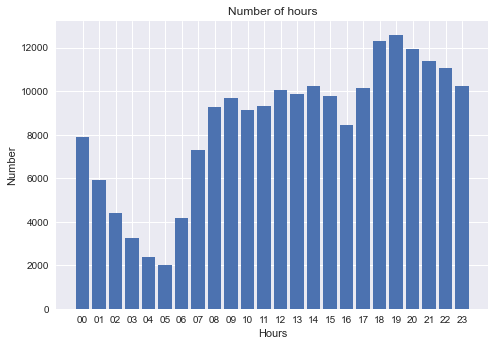

In [274]:
# use a more descriptive name for your function
from matplotlib import animation

query = engine.execute(Query_1).fetchall()
query = sorted(query, key=lambda variable: variable[0])

%matplotlib qt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
plt.style.use("seaborn")
langs = [i[0] for i in query]
students = [i[1] for i in query]
#bar = ax.bar(langs,students)
ax.set_ylabel('Number')
ax.set_xlabel('Hours')
ax.set_title('Number of hours')
palette = list(reversed(sns.color_palette("seismic", 24).as_hex()))

%matplotlib inline
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
bar = ax.bar(langs,students)
ax.set_ylabel('Number')
ax.set_xlabel('Hours')
ax.set_title('Number of hours')
plt.show()

### Visualization 2

Create a visualization that shows the average distance traveled per month for both taxis and Ubers combined. <br />
Painted areas are the 90% confidence interval around the mean.

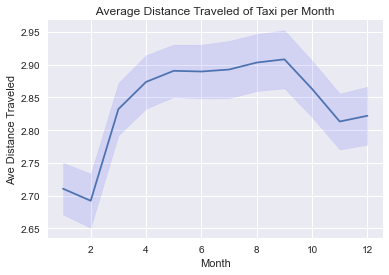

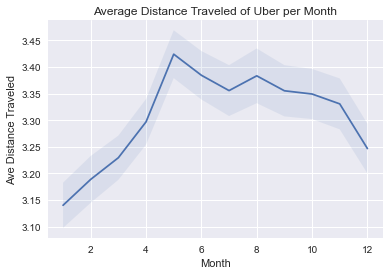

In [471]:
def average_distance_visual() -> None:
    
    taxi = taxi_data.groupby('Month')['Trip_Distance'].describe()
    taxi_mean = list(taxi['mean'])
    taxi_std = list(taxi['std'])
    taxi_count = list(taxi['count'])

    uber = uber_data.groupby('Month')['Trip_distance'].describe()
    uber_mean = list(uber['mean'])
    uber_std = list(uber['std'])
    uber_count = list(uber['count'])
    
    uber_ci = 1.645 * np.array(uber_std) / np.sqrt(uber_count)
    taxi_ci = 1.645 * np.array(taxi_std) / np.sqrt(taxi_count)
    
    fig, ax = plt.subplots()
    ax.plot(np.arange(1,13), taxi_mean, label = 'taxi')
    ax.fill_between(np.arange(1,13), taxi_mean-taxi_ci, taxi_mean+taxi_ci, color='b', alpha=0.1)
    plt.xlabel('Month')
    plt.ylabel('Ave Distance Traveled')
    plt.title(" Average Distance Traveled of Taxi per Month ")
    
    fig, ax = plt.subplots()
    ax.plot(np.arange(1,13), uber_mean, label='uber')
    ax.fill_between(np.arange(1,13), uber_mean-uber_ci, uber_mean+uber_ci,alpha=0.1)
    plt.xlabel('Month')
    plt.ylabel('Ave Distance Traveled')
    plt.title("Average Distance Traveled of Uber per Month")

    
    plt.show()

average_distance_visual()

### Visualization 3

Define three lat/long coordinate boxes around the three major New York airports: LGA, JFK, and EWR

In [310]:
def jfk_lat_condition(lat):
    if 40.630826 <= lat and lat <= 40.664038:
        return True
    else:
        return False
def jfk_lon_condition(lon):
    if -73.828297 <= lon and lon <= -73.740234:
        return True
    else:
        return False
def lga_lat_condition(lat):
    if 40.766599 <= lat and lat <= 40.780574:
        return True
    else:
        return False
def lga_lon_condition(lon):
    if -73.894043 <= lon and lon <= -73.854604:
        return True
    else:
        return False
def EWA_lat_condition(lat):
    if 40.669897 <= lat and lat <= 40.712069:
        return True
    else:
        return False
def EWA_lon_condition(lon):
    if -74.194365 <= lon and lon <= -74.152136:
        return True
    else:
        return False
    

Create a visualization that compares what day of the week was most popular for drop offs for each airport separately for Uber and Yellow Taxi

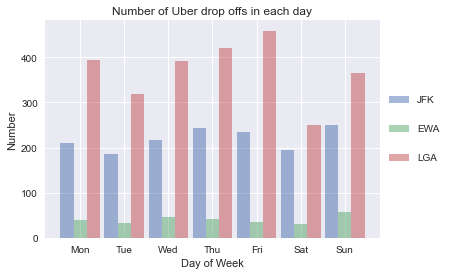

In [402]:
def uber_drop_offs_visual() -> None:
    
    uber_data_JFK = uber_data[uber_data['End_Lat'].apply(jfk_lat_condition)]
    uber_data_JFK = uber_data_JFK[uber_data_JFK['End_Lon'].apply(jfk_lon_condition)]

    uber_data_LGA = uber_data[uber_data['End_Lat'].apply(lga_lat_condition)]
    uber_data_LGA = uber_data_LGA[uber_data_LGA['End_Lon'].apply(lga_lon_condition)]

    uber_data_EWA = uber_data[uber_data['End_Lat'].apply(EWA_lat_condition)]
    uber_data_EWA = uber_data_EWA[uber_data_EWA['End_Lon'].apply(EWA_lon_condition)]

    uber_jfk_dayofweek_count = list(uber_data_JFK.groupby('DayofWeek').describe()['Time']['count'])
    uber_EWA_dayofweek_count = list(uber_data_EWA.groupby('DayofWeek').describe()['Time']['count'])
    uber_LGA_dayofweek_count = list(uber_data_LGA.groupby('DayofWeek').describe()['Time']['count'])
    
    fig, ax = plt.subplots()
    label = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
    x = np.arange(7)
    plt.bar(x-0.3, uber_jfk_dayofweek_count,0.3, alpha=0.5, label='JFK')
    plt.bar(x, uber_EWA_dayofweek_count,0.3, alpha=0.5, label='EWA')
    plt.bar(x+0.3, uber_LGA_dayofweek_count,0.3, alpha=0.5, label ='LGA')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), labelspacing=2)
    plt.xticks(x, label)
    plt.xlabel('Day of Week')
    plt.ylabel('Number')
    plt.title("Number of Uber drop offs in each day")
    plt.show()

uber_drop_offs_visual()

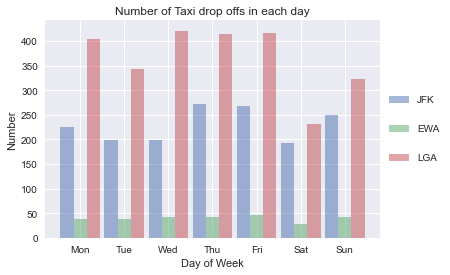

In [403]:
def taxi_drop_offs_visual() -> None:
    taxi_data_JFK = taxi_data[taxi_data['End_Lat'].apply(jfk_lat_condition)]
    taxi_data_JFK = taxi_data_JFK[taxi_data_JFK['End_Lon'].apply(jfk_lon_condition)]
    taxi_data_LGA = taxi_data[taxi_data['End_Lat'].apply(lga_lat_condition)]
    taxi_data_LGA = taxi_data_LGA[taxi_data_LGA['End_Lon'].apply(lga_lon_condition)]

    taxi_data_EWA = taxi_data[taxi_data['End_Lat'].apply(EWA_lat_condition)]
    taxi_data_EWA = taxi_data_EWA[taxi_data_EWA['End_Lon'].apply(EWA_lon_condition)]

    taxi_jfk_dayofweek_count = list(taxi_data_JFK.groupby('DayofWeek').describe()['Time']['count'])
    taxi_EWA_dayofweek_count = list(taxi_data_EWA.groupby('DayofWeek').describe()['Time']['count'])
    taxi_LGA_dayofweek_count = list(taxi_data_LGA.groupby('DayofWeek').describe()['Time']['count'])
    fig, ax = plt.subplots()
    label = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
    x = np.arange(7)
    plt.bar(x-0.3, taxi_jfk_dayofweek_count,0.3, alpha=0.5, label='JFK')
    plt.bar(x, taxi_EWA_dayofweek_count,0.3, alpha=0.5, label='EWA')
    plt.bar(x+0.3, taxi_LGA_dayofweek_count,0.3, alpha=0.5, label ='LGA')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), labelspacing=2)
    plt.xticks(x, label)
    plt.xlabel('Day of Week')
    plt.ylabel('Number')
    plt.title("Number of Taxi drop offs in each day")
    plt.show()
    
taxi_drop_offs_visual()

### Visualization 4

Create a month wise **animated** heatmap of all pickup locations in NYC area to explore changes in popular pickup areas of each month

In [455]:
def heat_map_visual() -> None:
    taxi_pickup = taxi_data[["Start_Lon","Start_Lat","Month"]]
    uber_pickup = uber_data[["Start_Lon","Start_Lat","Month"]]
    frames = [taxi_pickup, uber_pickup]
    heat_df = pd.concat(frames)


    heat_df['Weight'] = heat_df['Month'].astype(int)
    #heat_df['Weight'] = heat_df['Weight'].astype(float)
    # heat_df = heat_data.dropna(axis=0, subset=['Start_Lon','Start_Lat', 'Weight'])


    newyork_on_heatmap = folium.Map(location=[40.767937,-73.982155 ],tiles= "Stamen Terrain",
                    zoom_start = 13) 

    # List comprehension to make out list of lists
    heat_data = [[[row['Start_Lat'],row['Start_Lon']] 
                for index, row in heat_df[heat_df['Weight'] == i].iterrows()] 
                 for i in range(1,13)]

    # Plot it on the map
    hm = plugins.HeatMapWithTime(heat_data,auto_play=True,max_opacity=0.7)
    hm.add_to(newyork_on_heatmap)

    # Display the map
    newyork_on_heatmap

heat_map_visual()

### Visualization 5

Create a scatter plot that compares tip amount versus distance for Yellow Taxi rides. <br />
Tip amounts over 40 are considered as outliners and thus are removed

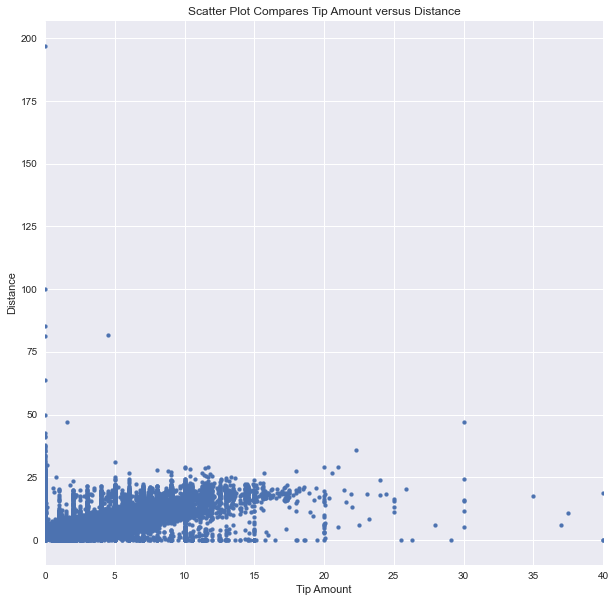

In [406]:
def tip_distance_visual() -> None:
    taxi_tip = list(taxi_data['Tip_Amt'])
    taxi_distance = list(taxi_data['Trip_Distance'])
    s_exp = 3
    fig, ax = plt.subplots(figsize=(10,10))
    plt.scatter(taxi_tip,taxi_distance,s=15)
    plt.xlabel('Tip Amount')
    plt.ylabel('Distance')
    plt.title("Scatter Plot Compares Tip Amount versus Distance")
    ax.set_xlim(0, 40)
    plt.show()
tip_distance_visual()

### Visualization 6

Create a scatter plot that compares tip amount versus precipitation amount for Yellow Taxi rides.<br />
Tip amounts over 40 are considered as outliners and thus are removed

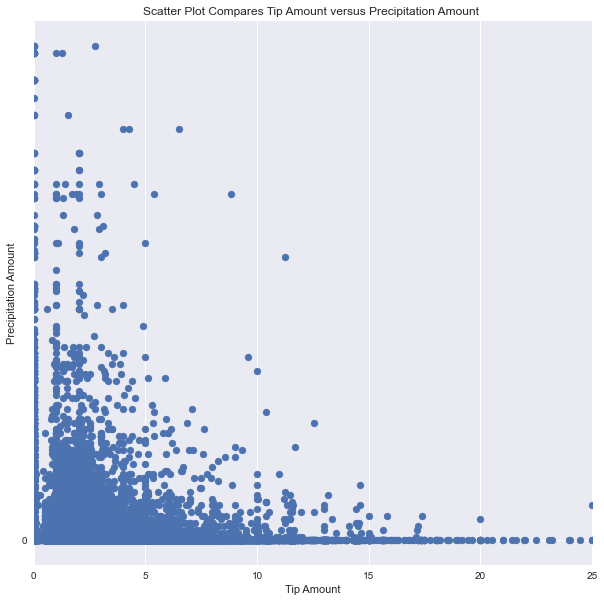

In [453]:
def tip_prec_visual() -> None: 
    
    taxi_tip = taxi_data[['Year',"Tip_Amt","Month","Day",'Time']]
    weather_prec = hourly_weather_data[["HourlyPrecipitation",'Year',"Month","Day",'Hour']]
    Tip_Prec = pd.merge(taxi_tip, weather_prec,  how='inner', left_on=['Year','Month','Day','Time'], right_on = ['Year','Month','Day','Hour'])
    Tip_Prec_tip = Tip_Prec['Tip_Amt']
    Tip_Prec_hour = Tip_Prec['HourlyPrecipitation']
    fig, ax = plt.subplots(figsize=(10,10))
    plt.scatter(Tip_Prec_tip, Tip_Prec_hour)
    plt.xlabel('Tip Amount')
    plt.ylabel('Precipitation Amount')
    plt.title("Scatter Plot Compares Tip Amount versus Precipitation Amount ")
    ax.yaxis.set_major_locator(tck.MultipleLocator(6))
    ax.yaxis.set_minor_locator(tck.MultipleLocator(2))
    ax.set_xlim(0, 25)
    plt.show()

tip_prec_visual()